In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import PIL
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from sklearn.utils import shuffle
import math

In [2]:
def calibrate_camera():
    
    nx = 9
    ny = 6
    
    objpoints = [] #3d points in real world
    imgpoints = [] #2d points in image plane
    
    objp = np.zeros((nx*ny,3),np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2) # x,y coordinates. z is always 0
    
    #compute imgpoints,objpoints
    for img_path in glob.glob('./camera_cal/calibration*.jpg'):
        img = cv2.imread(img_path)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
        
        if ret == True:
            imgpoints.append(corners)
            objpoints.append(objp)
        
    
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)       
    
    return mtx,dist
    
def undistort_img(img,mtx,dist):
    return cv2.undistort(img, mtx, dist, None, mtx)


def threshold_img(img):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    thresh_min = 50
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold color channel
    s_thresh_min = 170
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary

def get_roi_vertices(imshape):
    return np.array([(imshape[1]*0.4, imshape[0]*0.65), 
                (imshape[1]*0.6, imshape[0]*0.65), 
                (imshape[1]*0.92,imshape[0]),
                (imshape[0]*0.2,imshape[0])], dtype=np.float32)   

def compute_transform_matrix(img):
    imshape = img.shape

    src = get_roi_vertices(imshape)
        
    dst = np.float32([[0, 0], 
                      [imshape[1], 0], 
                      [imshape[1], imshape[0]], 
                      [0, imshape[0]]])        

    # Given src and dst points, calculate the perspective transform matrix
    M =  cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    return M,Minv

def perspective_transform(img,M):
    img_size = (img.shape[1],img.shape[0])
    return cv2.warpPerspective(img, M, img_size)


def lane_boundaries(binary_warped, with_draw = False):
    
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 150
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        if with_draw :
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 4) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 4) 

        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    if with_draw :
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        plt.imshow(out_img)
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, out_img.shape[1])
        plt.ylim(out_img.shape[0], 0)
        plt.show()
        plt.figure()
    
    
    return left_fitx, right_fitx, ploty, leftx, rightx

def compute_curvature(leftx, rightx, ploty):
    
    min_len = min(len(leftx),len(rightx),len(ploty))

    leftx = np.asarray(sorted(shuffle(leftx)[:min_len]))
    rightx = np.asarray(sorted(shuffle(rightx)[:min_len]))
    ploty = np.asarray(sorted(shuffle(ploty)[:min_len]))
    
    y_eval = np.max(ploty)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
#     print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    
    return left_curverad, right_curverad

def detect_offset(u_img, left_fitx, right_fitx):
    img_center = u_img.shape[1] // 2
    left_line = left_fitx[0]
    right_line = right_fitx[0]
    center_line = left_line + right_line // 2
    
    offset = abs(img_center - center_line)
    
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    offset_in_meters = offset * xm_per_pix
    
    return offset_in_meters
    
    
def plot_lane_boundaries(u_img, binary_warped):
    
    left_fitx, right_fitx, ploty, leftx, rightx = lane_boundaries(binary_warped, with_draw = False)

    left_curve, right_curve = compute_curvature(leftx, rightx, ploty)
    offset = detect_offset(u_img, left_fitx, right_fitx)
    
     # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, inverse_transform_matrix, (u_img.shape[1], u_img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(u_img, 1, newwarp, 0.3, 0)
    
    result = cv2.putText(result, "Radius of curvature = {} m".format(round(left_curve + right_curve / 2,2)), (100, 100), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 255, 255), 2, cv2.LINE_AA)
    result = cv2.putText(result, "Vehicle offset = {} m".format(round(offset,2)), (100, 200), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 255, 255), 2, cv2.LINE_AA)

    return result


def threshold_img(img):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    thresh_min = 100
    thresh_max = 150
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold color channel
    s_thresh_min = 180
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary

# Calibrate Camera

In [3]:
mtx,dist = calibrate_camera()

# Undistort Images

In [4]:
raw_imgs = [PIL.Image.open(img_path) for img_path in glob.glob('./test_images/*')]
undistorted_imgs = [undistort_img(np.asarray(img),mtx,dist) for img in raw_imgs]

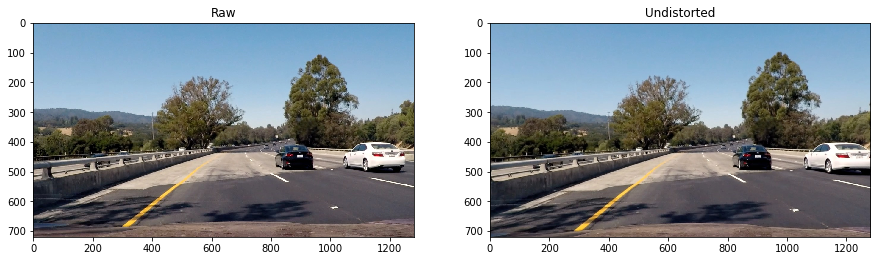

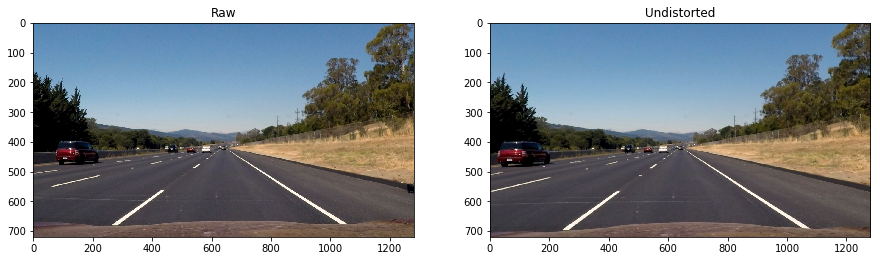

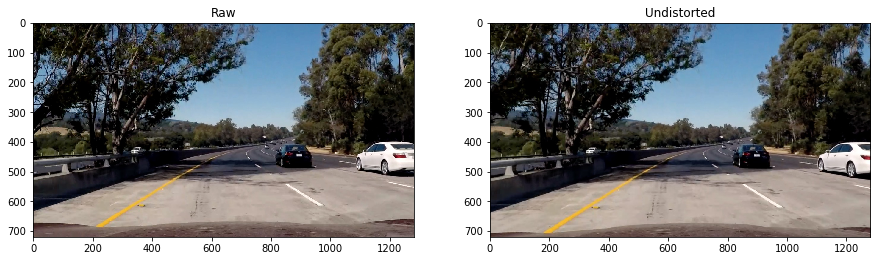

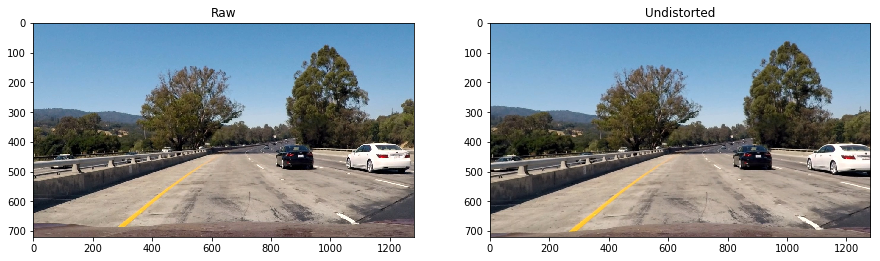

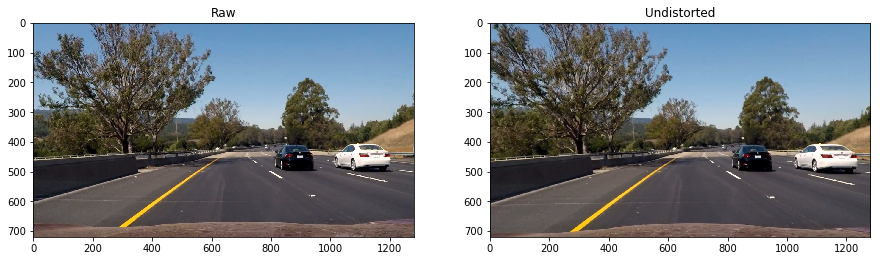

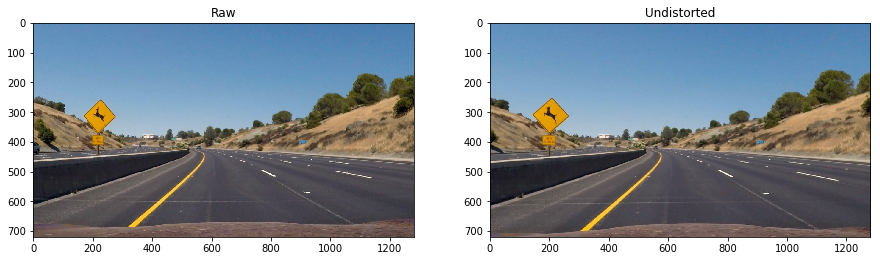

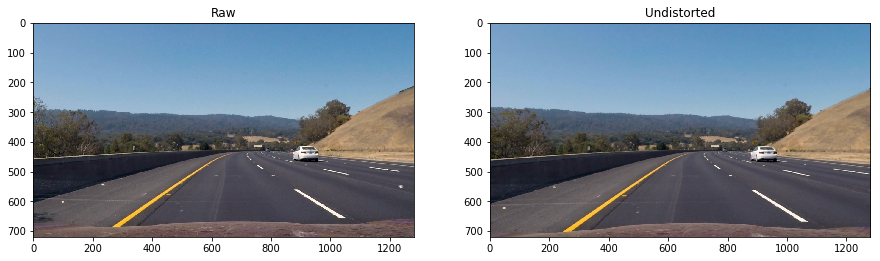

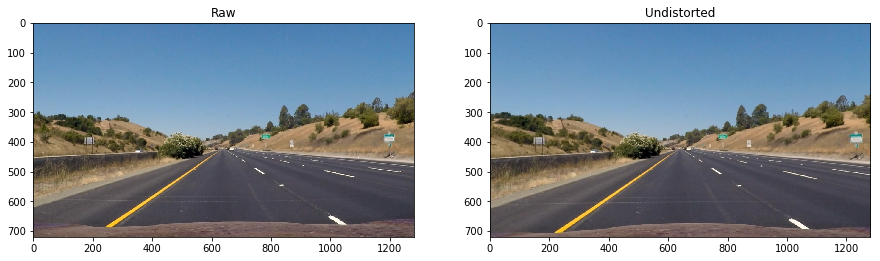

In [5]:
for r_img, u_img in zip(raw_imgs, undistorted_imgs):
    
    plt.figure(figsize=(15,15))
    
    plt.subplot(1,2,1)
    plt.title("Raw")
    plt.imshow(r_img)
    
    plt.subplot(1,2,2)
    plt.title("Undistorted")
    plt.imshow(u_img)
    
    plt.show()

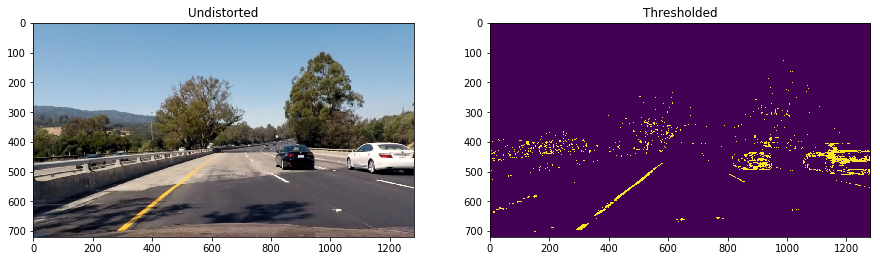

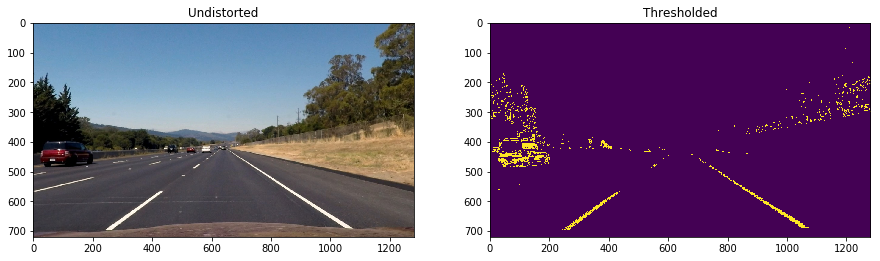

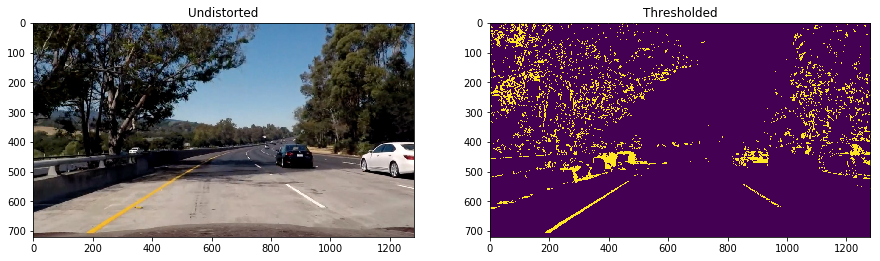

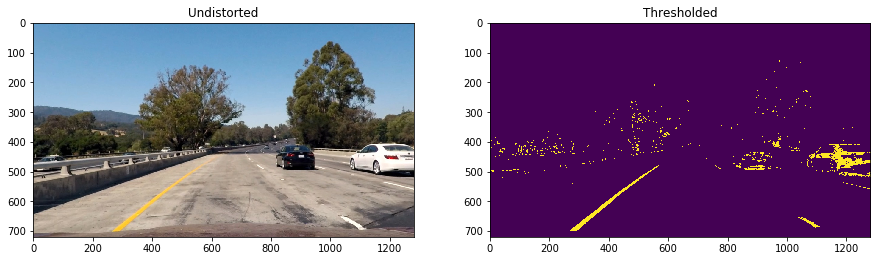

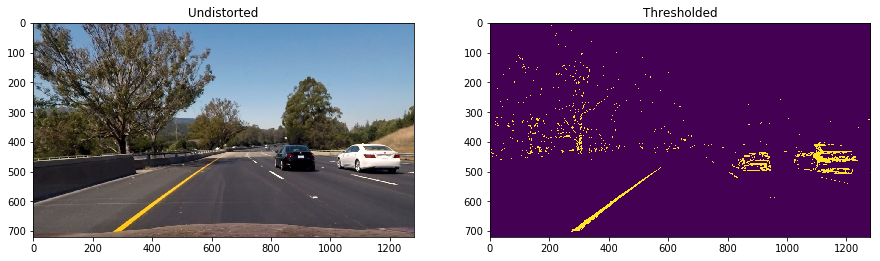

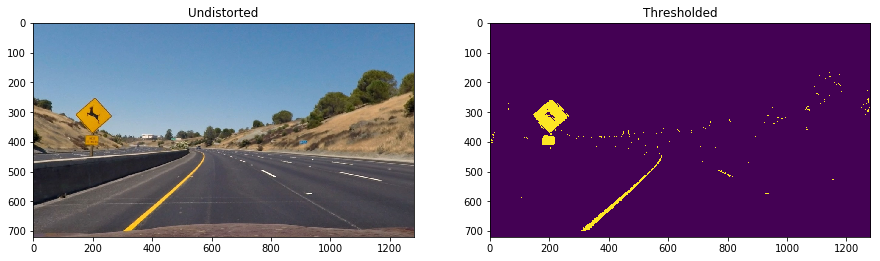

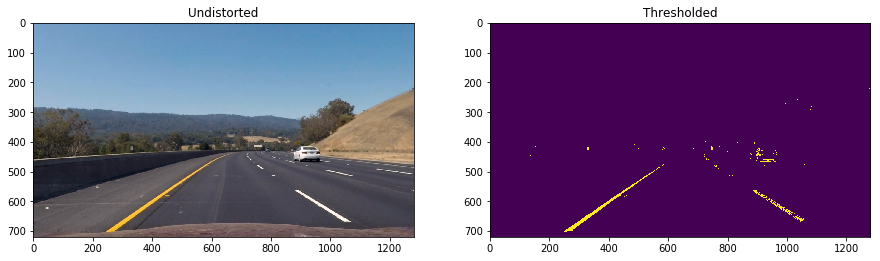

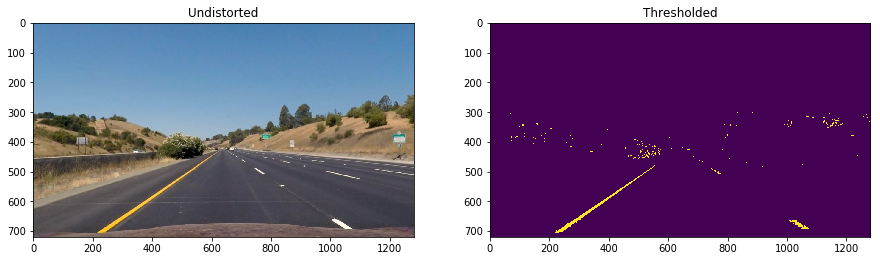

In [6]:
for u_img in undistorted_imgs:
    t_img = threshold_img(u_img)
    
    plt.figure(figsize=(15,15))
    
    plt.subplot(1,2,1)
    plt.title("Undistorted")
    plt.imshow(u_img)
    
    plt.subplot(1,2,2)
    plt.title("Thresholded")
    plt.imshow(t_img)
    
    plt.show()

# Threshold imgs on color & gradient

In [7]:
thresholded_imgs = [threshold_img(u_img) for u_img in undistorted_imgs]

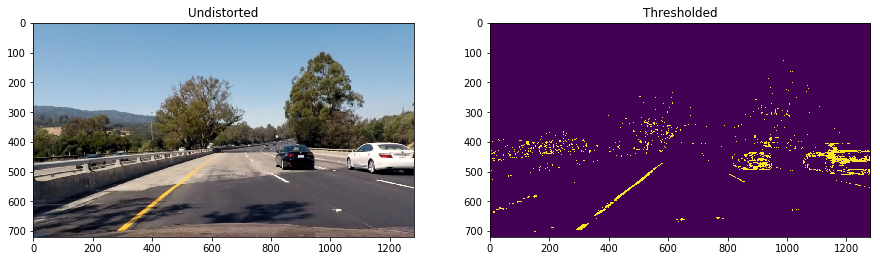

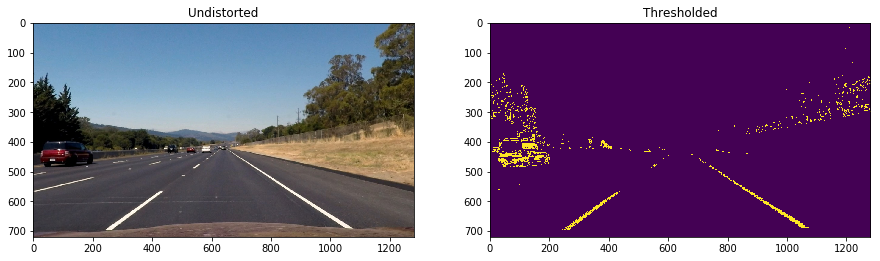

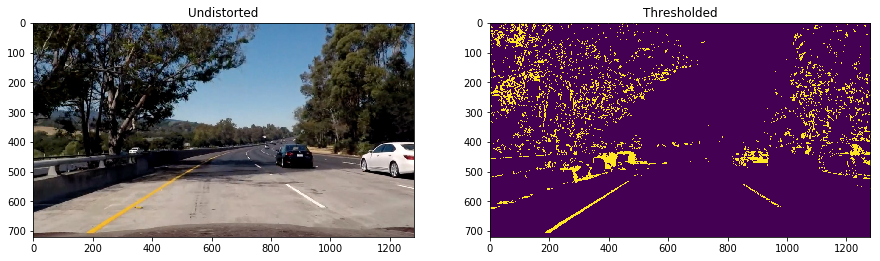

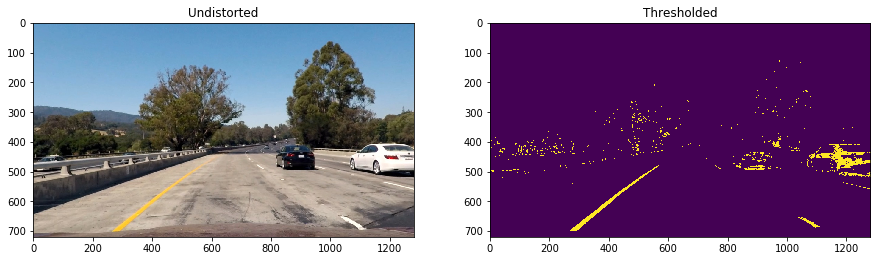

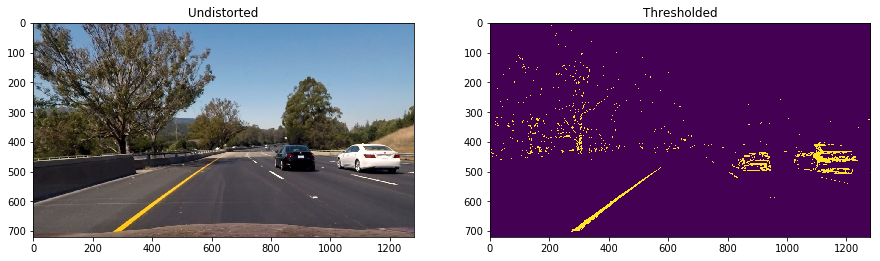

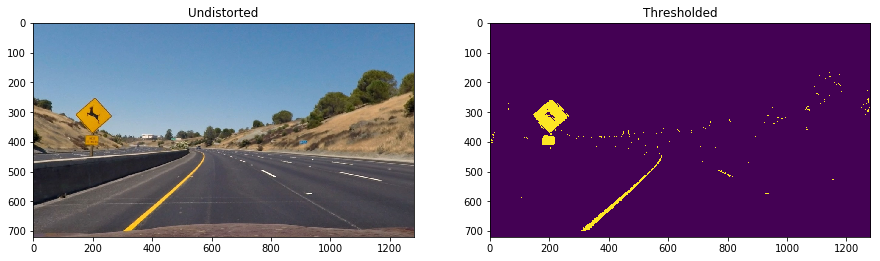

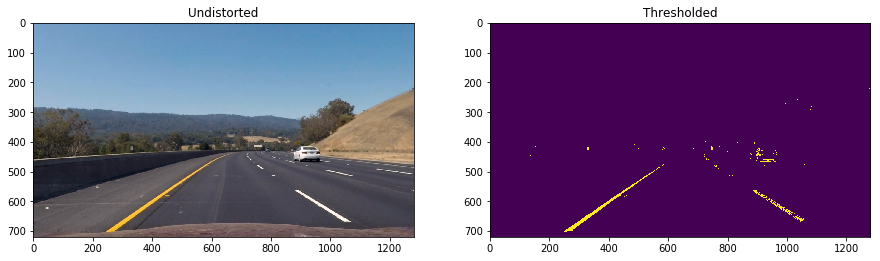

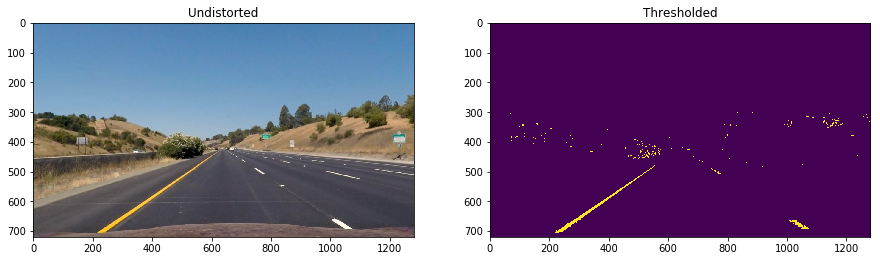

In [8]:
for u_img, t_img in zip(undistorted_imgs, thresholded_imgs):
    
    plt.figure(figsize=(15,15))
    
    plt.subplot(1,2,1)
    plt.title("Undistorted")
    plt.imshow(u_img)
    
    plt.subplot(1,2,2)
    plt.title("Thresholded")
    plt.imshow(t_img)
    
    plt.show()

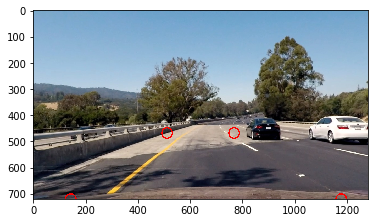

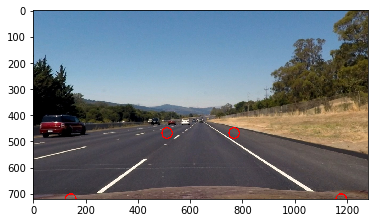

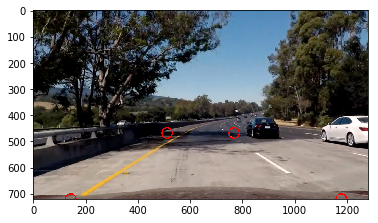

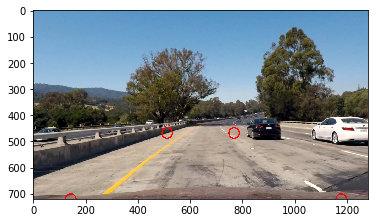

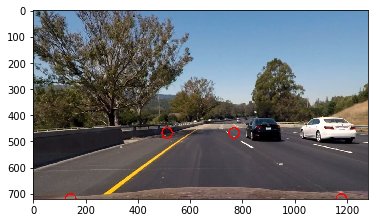

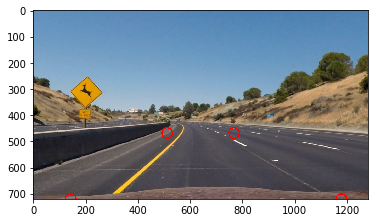

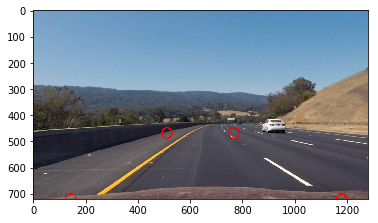

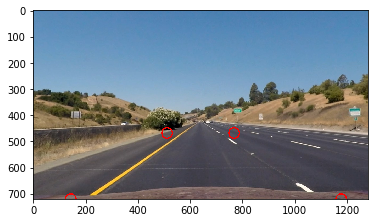

In [9]:
for img in undistorted_imgs:

    src = get_roi_vertices(img.shape)

    with_v = img.copy()
    for vertice in src:
        with_v = cv2.circle(with_v, (vertice[0], vertice[1]), 20, (255,0,0), 3)
        
    plt.imshow(with_v)
    plt.figure()
    plt.show()

# Perspective Transform

In [10]:
transform_matrix, inverse_transform_matrix = compute_transform_matrix(thresholded_imgs[0]) # all imgs same size. we can reuse it

In [11]:
pt_threshold_imgs = [perspective_transform(img,transform_matrix) for img in thresholded_imgs]
pt_undist_imgs = [perspective_transform(img,transform_matrix) for img in undistorted_imgs]

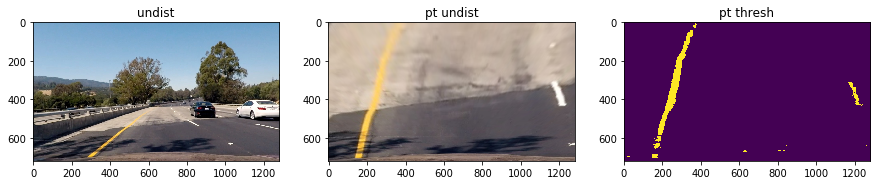

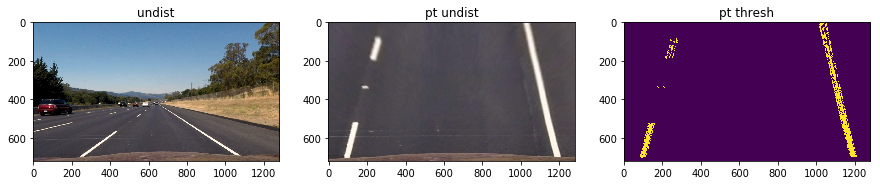

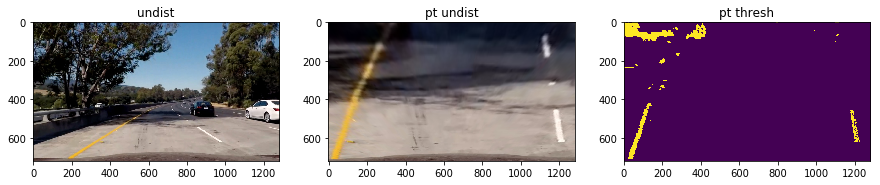

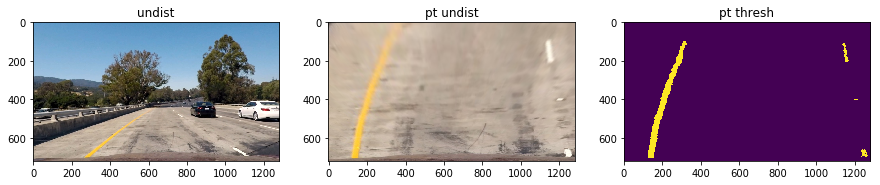

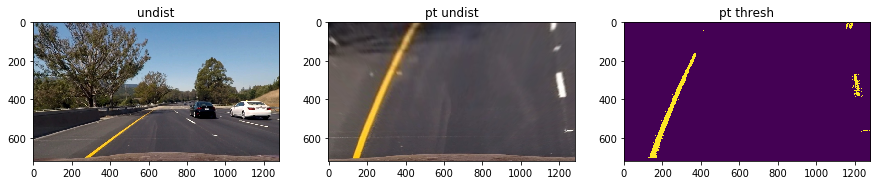

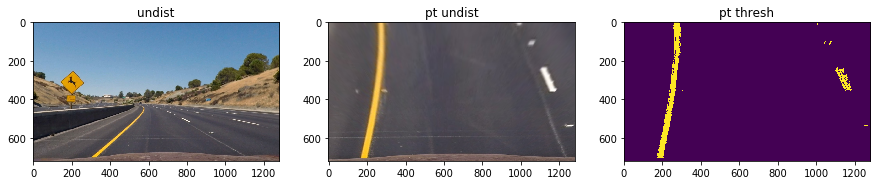

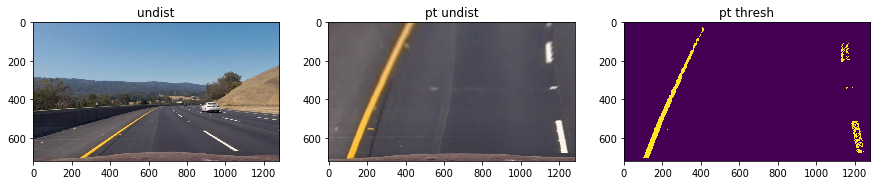

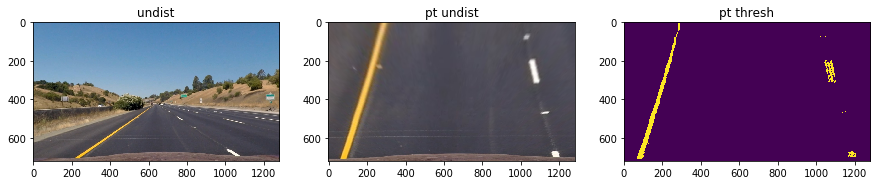

In [12]:
for t_img, pt_u_img, pt_t_img in zip(undistorted_imgs, pt_undist_imgs, pt_threshold_imgs):
    
    plt.figure(figsize=(15,15))
    
    plt.subplot(1,3,1)
    plt.title("undist")
    plt.imshow(t_img)
    
    plt.subplot(1,3,2)
    plt.title("pt undist")
    plt.imshow(pt_u_img)

    plt.subplot(1,3,3)
    plt.title("pt thresh")
    plt.imshow(pt_t_img)

    plt.show()

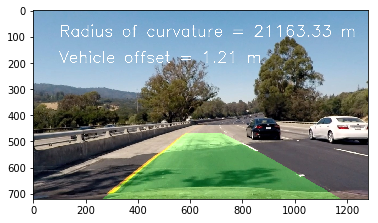

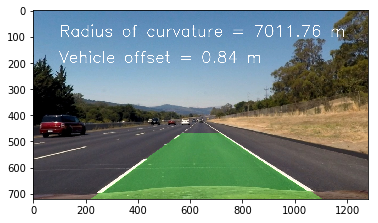

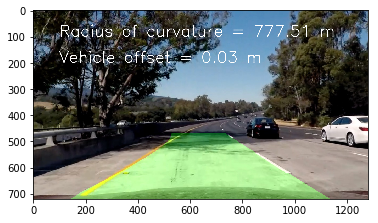

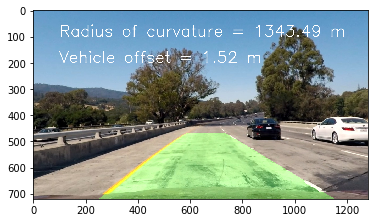

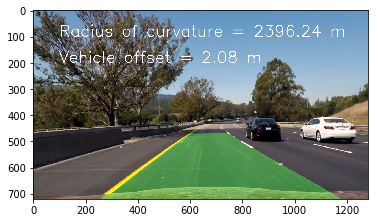

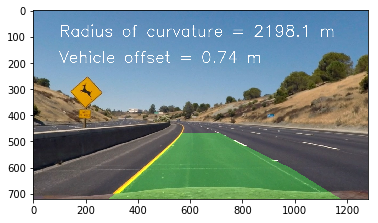

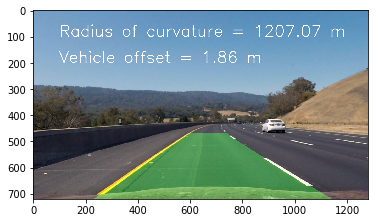

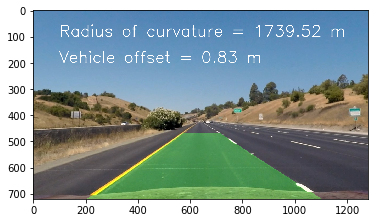

In [13]:
for u_img,binary_warped in zip(undistorted_imgs,pt_threshold_imgs):
    
    result = plot_lane_boundaries(u_img, binary_warped)   

    plt.imshow(result)
    plt.figure()
    plt.show()

# Video

In [14]:
def process_image(img):
    undistorted_img = undistort_img(np.asarray(img),mtx,dist)
    thresholded_img = threshold_img(undistorted_img)

    transform_matrix, inverse_transform_matrix = compute_transform_matrix(thresholded_img)
    pt_threshold_img = perspective_transform(thresholded_img,transform_matrix)

    final_img = plot_lane_boundaries(undistorted_img,pt_threshold_img)
    
    return final_img

In [15]:
clip1 = VideoFileClip("./project_video.mp4")

video_output = './project_video_output.mp4'
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video ./project_video_output.mp4
[MoviePy] Writing video ./project_video_output.mp4


100%|█████████▉| 1260/1261 [01:56<00:00, 10.79it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./project_video_output.mp4 

CPU times: user 37min 39s, sys: 2min 6s, total: 39min 46s
Wall time: 1min 57s


In [16]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

# Process Test Images

In [17]:
raw_imgs = [PIL.Image.open(img_path) for img_path in glob.glob('./test_images/*')]
undistorted_imgs = [undistort_img(np.asarray(img),mtx,dist) for img in raw_imgs]
thresholded_imgs = [threshold_img(u_img) for u_img in undistorted_imgs]

transform_matrix, inverse_transform_matrix = compute_transform_matrix(thresholded_imgs[0])
pt_threshold_imgs = [perspective_transform(img,transform_matrix) for img in thresholded_imgs]

final_imgs = [plot_lane_boundaries(u_img,binary_warped) for u_img,binary_warped in zip(undistorted_imgs,pt_threshold_imgs)]

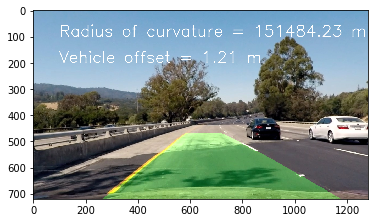

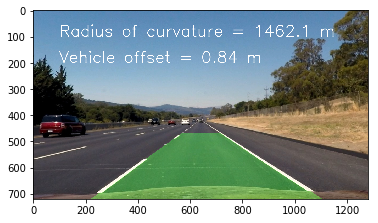

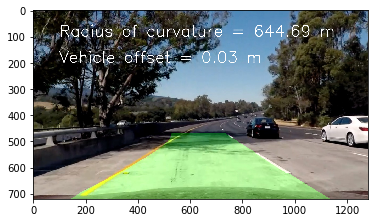

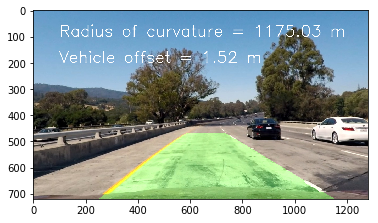

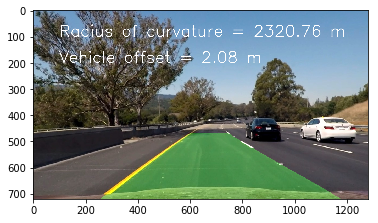

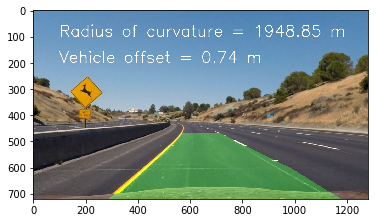

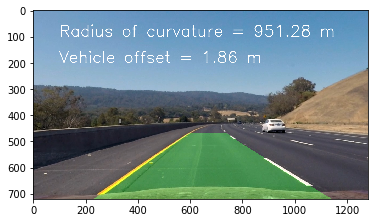

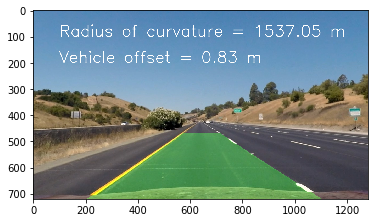

In [18]:
for img in final_imgs:
    plt.imshow(img)
    plt.figure()
    plt.show()
    

In [19]:
for index,img in enumerate(final_imgs):
    PIL.Image.fromarray(img).save("./output_images/img_"+str(index)+".jpg")